# Project 3
Arushi Madan, Nikki Agrawal, Laura Schultejans

In [ ]:
!pip install wooldridge
!pip install linearmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 35.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.5/94.5 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 3.2 MB/s eta 0:00:00


In [ ]:
# import packages
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import random; random.seed(10) # pre-setting seed
from scipy import stats
from scipy.stats import norm, chi2, f
import wooldridge as woo

# For model fitting
import statsmodels.api as sm
import statsmodels.stats.api as sms
import statsmodels.formula.api as smf
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Model evaluation
from sklearn.metrics import *

# Ordered choice model
from statsmodels.miscmodels.ordinal_model import OrderedModel

# For panel data models
from linearmodels.panel import PanelOLS, PooledOLS, RandomEffects # BetweenOLS
from linearmodels.panel import compare # displaying panel data models

# For seemingly unrelated regression
from collections import OrderedDict
from linearmodels.system import SUR


# Tobit model
 # from tobit_model import tobit # from .py file ### NOT WORKING

# Sample selection
# from heckman import Heckman ### NOT WORKING


# For R kernel
# Note: need working copy of R, initiate chunk with `%%R`
import rpy2.ipython
%load_ext rpy2.ipython

In [ ]:
prison = woo.data("prison")
prison.describe()

,state,year,govelec,black,metro,unem,criv,crip,lcriv,lcrip,...,cag18_24,cag25_34,cunem,cblack,cmetro,pris,lpris,gpris,final1,final2
count,714.00000,714.000000,714.00000,714.000000,714.000000,714.000000,714.000000,714.000000,714.000000,714.000000,...,714.000000,714.000000,714.000000,714.000000,714.000000,714.000000,714.000000,714.000000,714.000000,714.000000
mean,26.00000,86.500000,0.25070,0.105329,0.641727,0.068487,5.078585,46.435141,1.426112,3.803649,...,-0.002448,-0.000262,0.000525,0.030098,0.001596,199.980341,5.129948,0.066474,0.008403,0.016807
std,14.72992,4.033955,0.43372,0.121210,0.225690,0.022151,3.440078,12.117244,0.654660,0.265534,...,0.002047,0.003081,0.012399,0.089816,0.003081,132.713456,0.580049,0.066585,0.091348,0.128637
min,1.00000,80.000000,0.00000,0.002000,0.153000,0.021420,0.475628,20.965015,-0.743120,3.042855,...,-0.010630,-0.008652,-0.041840,-0.450005,-0.003500,20.826952,3.036248,-0.214960,0.000000,0.000000
25%,13.00000,83.000000,0.00000,0.020250,0.457850,0.053000,2.824363,38.671989,1.038283,3.655116,...,-0.003680,-0.002845,-0.007000,0.009999,0.000000,113.038683,4.727730,0.024878,0.000000,0.000000
50%,26.00000,86.500000,0.00000,0.071000,0.671350,0.066000,4.515549,45.185146,1.507526,3.810768,...,-0.002491,-0.000067,-0.000790,0.020000,0.000800,172.454063,5.150131,0.064914,0.000000,0.000000
75%,39.00000,90.000000,0.75000,0.148075,0.815925,0.080958,6.500603,54.392672,1.871895,3.996229,...,-0.001178,0.001760,0.008640,0.070000,0.002200,251.896126,5.529016,0.104964,0.000000,0.000000
max,51.00000,93.000000,1.00000,0.703000,1.000000,0.180330,29.217993,88.392731,3.374785,4.481790,...,0.005333,0.010487,0.046580,0.490002,0.014300,1286.837524,7.159943,0.364590,1.000000,1.000000


# Question 1

### 1.
Briefly discuss your data and economic/finance/business question you are trying to answer with your model.

Using the prison dataset from wooldridge, we would like to explore which factors, if any, influence the prison population in the United States. We will conduct descriptive analysis of our potential regressors, explore the pooled, fixed effect, and random effect models, and test to see which type of model suits our estimation the best.

###  2.
Provide a descriptive analysis of your variables. This should include histograms and fitted distributions, correlation plot, boxplots, scatterplots, and statistical summaries (e.g., the five-number summary). All figures must include comments.

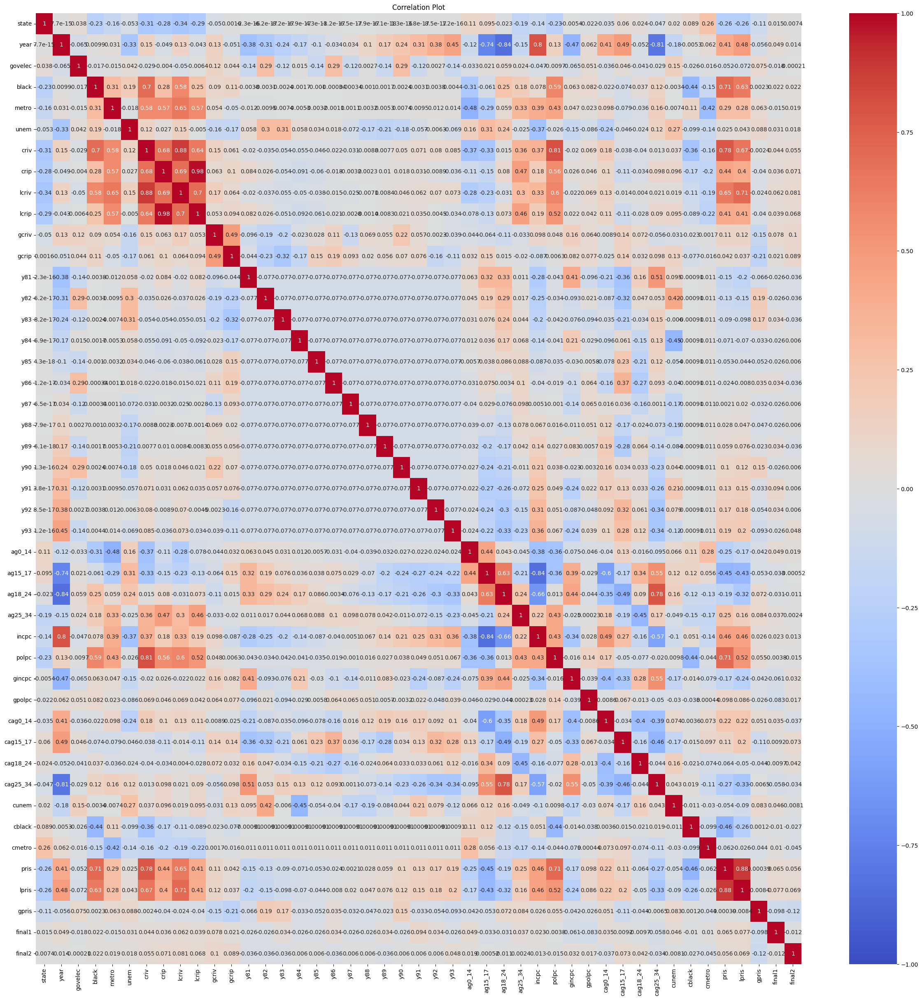

In [ ]:
# correlation matrix
matrix = prison.corr()

plt.figure(figsize=(30, 30))
sns.heatmap(matrix, annot=True, vmin=-1, vmax=1, cmap="coolwarm")
plt.title('Correlation Plot')
plt.show()

#### Correlation Matrix:
- From this plot, we would like to select variables that are highly correlated with our dependent variable (pris), but that have little correlation with other independent variables.
- For that reason, we select the following initial variables and then use the other plots to make a fully informed decision on which ones to include in our model: polpc, incpc, cblack, ag15_17, criv, black
- As a note, from this graph, since crip and criv have a relatively large correlation, we select to use only criv since it has a higher correlation with pris than crip does.

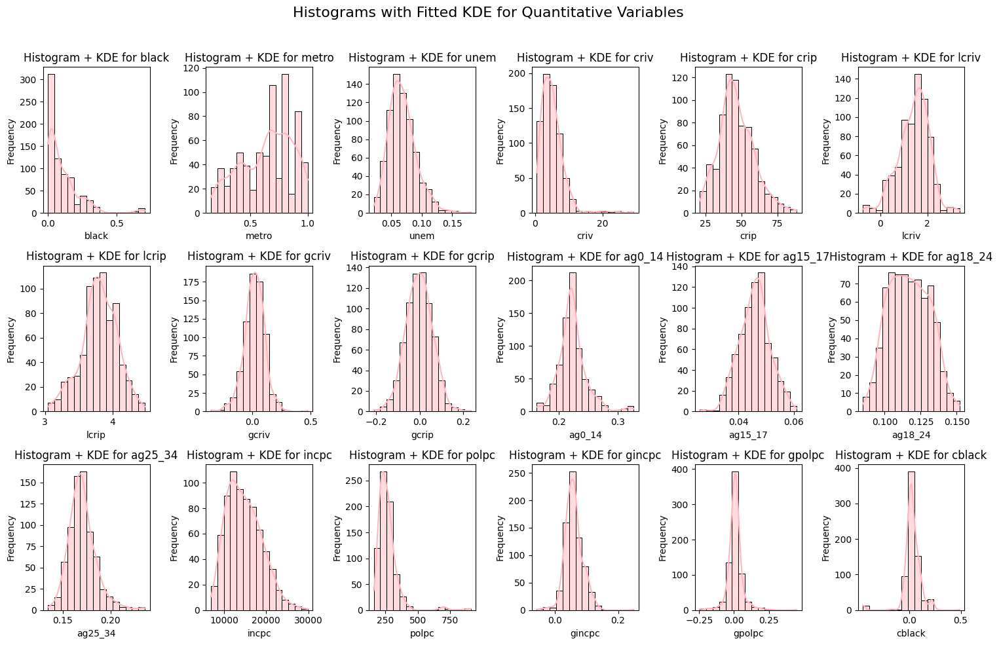

In [ ]:
# fitted distributions and histograms
quant = prison[['black', 'metro', 'unem', 'criv', 'crip', 'lcriv', 'lcrip', 'gcriv', 'gcrip', 'ag0_14', 'ag15_17', 'ag18_24', 'ag25_34', 'incpc', 'polpc', 'gincpc', 'gpolpc', 'cblack']]

fig, axes = plt.subplots(3, 6, figsize=(15, 10))
axes = axes.flatten()

for i, column in enumerate(quant.columns):
    sns.histplot(quant[column], kde=True, ax=axes[i], bins=15, color="lightpink")

    axes[i].set_title(f"Histogram + KDE for {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

plt.suptitle("Histograms with Fitted KDE for Quantitative Variables", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

#### Fitted Distributions & Histograms:
We can see here that while most of the variables are mostly normally distributed, several are very skewed (such as polpc, black, metro, and criv). Given our correlation matrix interpretation above, we continue on with selecting all the mentioned variables aside from black and. We replace criv with log(criv) and polpc with gpolpc, as the new variables are far more normally distributed than its normal counterpart.

<Axes: xlabel='final2', ylabel='pris'>

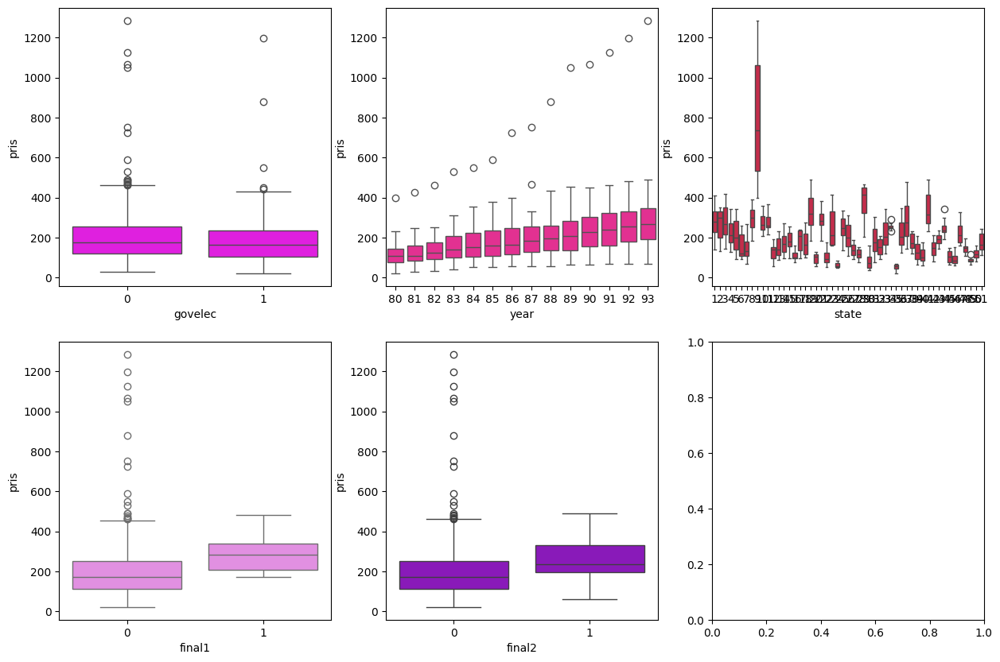

In [ ]:
# box plots
fig, ax = plt.subplots(2, 3, figsize=(15,10))
sns.boxplot(data=prison, x='govelec', y='pris', ax=ax[0,0], color='fuchsia')
sns.boxplot(data=prison, x='year', y='pris', ax=ax[0,1], color='deeppink')
sns.boxplot(data=prison, x='state', y='pris', ax=ax[0,2], color='crimson')
sns.boxplot(data=prison, x='final1', y='pris', ax=ax[1,0], color='violet')
sns.boxplot(data=prison, x='final2', y='pris', ax=ax[1,1], color='darkviolet')

#### Boxplots:
- We can see that the variations in prison populations for most of the discrete variables are not too different in terms of overlap. For the final variables, we do see significantly more outliers/skew in the "0" group than the "1" group. For the year and states plots, we also see a slight increasing trend in year and a major outlier in state 9, which is Washington DC. This intuitively makes sense since DC's prison system is federalized, meaning that individuals sentenced in DC will likely not remain in DC for their actual time in prison.

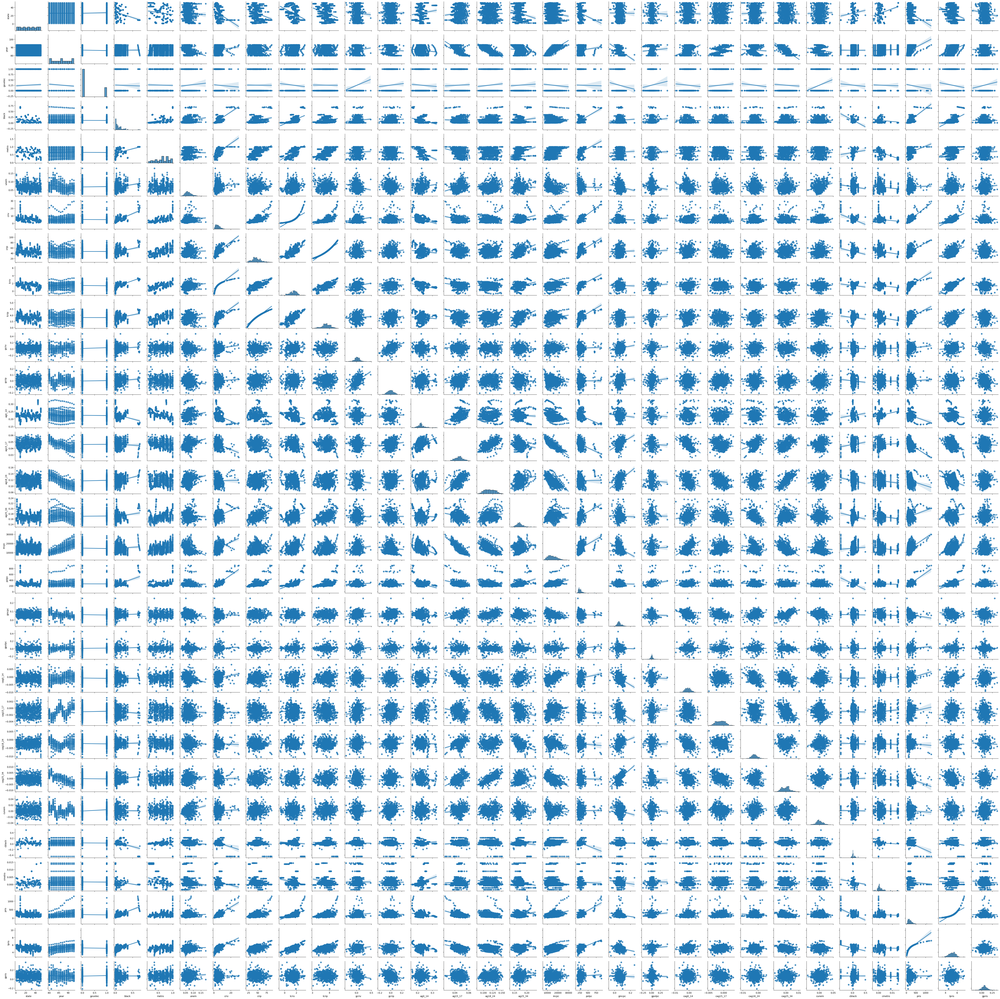

In [ ]:
# scatterplots - NEED TO REMOVE VARS AND RERUN
sns.pairplot(prison.drop(columns=['y81', 'y82', 'y83', 'y84', 'y85', 'y86', 'y87', 'y88', 'y89', 'y90', 'y91', 'y92', 'y93', 'final1', 'final2']),  kind='reg', height=2)
plt.tight_layout()

#### Scatterplots:
We can also justify our variable selection using the scatterplot and note that most of the variables do NOT have significant trends with other regressors, but do show potential trends with the dependent variable "pris".

### 3.
Fit the three models below, and identify which model is your preferred one and why. Make sure to include effects plots, statistical diagnostics, etc., to support your conclusion, and to comment on your findings.
* Pooled
* Fixed Effects
* Random Effects

In [ ]:
# data conversion
panel = prison.set_index(['state', 'year'])
panel.head()

govelec   black   metro     unem      criv       crip     lcriv  \
state year                                                                    
1     80          0  0.2560  0.6320  0.08775  4.447868  44.476376  1.492425   
      81          0  0.2557  0.6362  0.10667  4.700944  44.248787  1.547763   
      82          1  0.2554  0.6404  0.14367  4.497580  42.050446  1.503539   
      83          0  0.2551  0.6446  0.13667  4.186833  37.084393  1.431945   
      84          0  0.2548  0.6488  0.11167  4.353239  35.042255  1.470920   

               lcrip     gcriv     gcrip  ...  cag18_24  cag25_34    cunem  \
state year                                ...                                
1     80    3.794958  0.098786  0.174785  ...  0.000077  0.001990  0.01675   
      81    3.789828  0.055338 -0.005130  ...  0.000177  0.004632  0.01892   
      82    3.738870 -0.044224 -0.050958  ... -0.000712  0.000013  0.03700   
      83    3.613196 -0.071595 -0.125674  ... -0.001318  0.001163 -0.00700   
      84    3.556555  0.038976 -0.056642  ... -0.002618  0.001297 -0.02500   

              cblack  cmetro        pris     lpris     gpris  final1  final2  
state year                                                                    
1     80   -0.059999  0.0002  141.334717  4.951131 -0.020659       0       0  
      81   -0.030001  0.0042  163.533646  5.097019  0.145888       0       0  
      82   -0.029999  0.0042  183.694809  5.213276  0.116257       0       0  
      83   -0.030001  0.0042  218.624207  5.387354  0.174078       0       0  
      84   -0.030001  0.0042  245.068619  5.501538  0.114184       0       0  

[5 rows x 43 columns]

Recall from above that these are the variables we have chosen to use:
gpolpc, incpc, cblack, ag15_17, lcriv

In [ ]:
# pooled model
pooled = PooledOLS.from_formula('pris ~ 1 + gpolpc + incpc + cblack + ag15_17 + lcriv', data=panel)
pooled_mod = pooled.fit()
print(pooled_mod.summary)

                          PooledOLS Estimation Summary                          
Dep. Variable:                   pris   R-squared:                        0.6640
Estimator:                  PooledOLS   R-squared (Between):              0.6994
No. Observations:                 714   R-squared (Within):               0.5711
Date:                Fri, Dec 06 2024   R-squared (Overall):              0.6640
Time:                        05:12:37   Log-likelihood                   -4113.4
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      279.89
Entities:                          51   P-value                           0.0000
Avg Obs:                       14.000   Distribution:                   F(5,708)
Min Obs:                       14.000                                           
Max Obs:                       14.000   F-statistic (robust):             279.89
                            

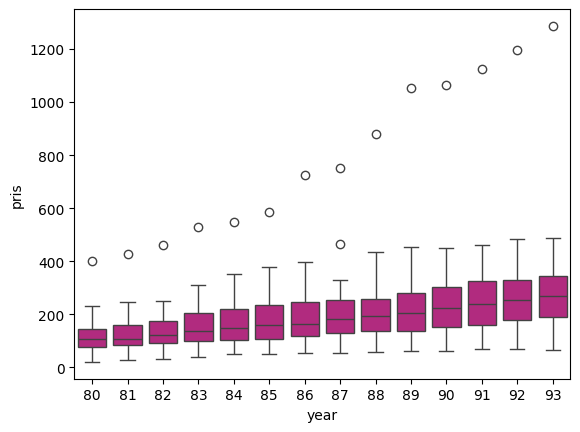

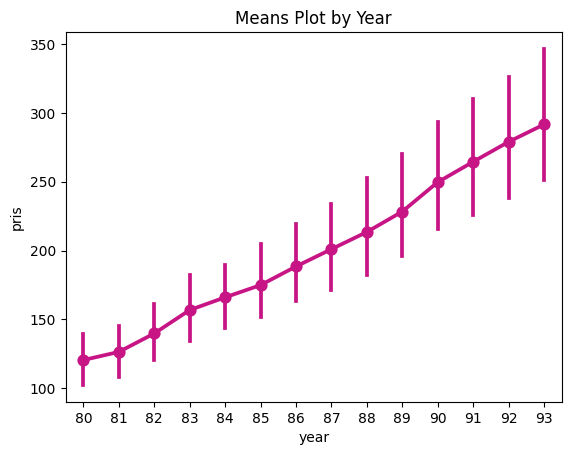

In [ ]:
# heterogeneity exploration across time
sns.boxplot(prison, x='year', y='pris', color="mediumvioletred")
plt.show()

sns.pointplot(prison, x='year', y='pris', color="mediumvioletred")
plt.title("Means Plot by Year")
plt.show()

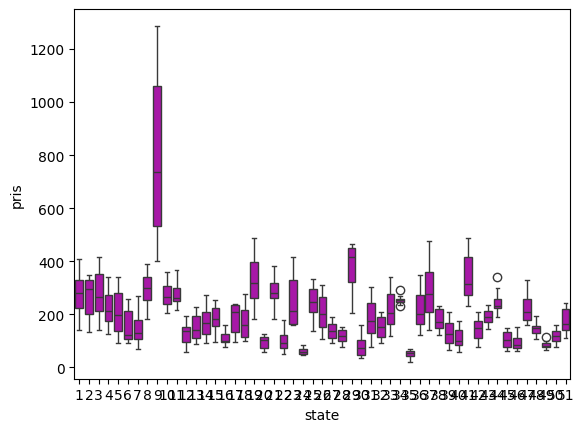

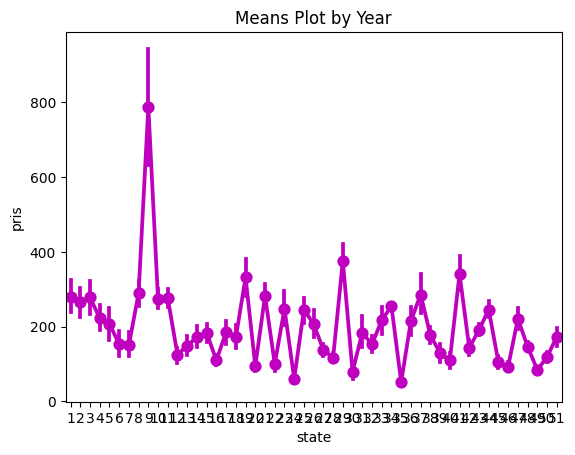

In [ ]:
# and across individuals
sns.boxplot(prison, x='state', y='pris', color="m")
plt.show()

sns.pointplot(prison, x='state', y='pris', color="m")
plt.title("Means Plot by Year")
plt.show()

#### Pooled OLS:
- We can see from the outputs above that there is quite a bit of heterogeneity across time specifically.
- This encourages us to explore fixed and random effects plots to see if different estimation methods can potentially mitigate those issues

In [ ]:
# fixed effects
top10 = prison.loc[[s in range(11) for s in prison['state']]]

panel10 = top10.set_index(['state', 'year'])
fixed_mod = PanelOLS.from_formula('pris ~ 1 + gpolpc + incpc + cblack + ag15_17 + lcriv + EntityEffects + TimeEffects', data=panel10).fit()
print(fixed_mod.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:                   pris   R-squared:                        0.3297
Estimator:                   PanelOLS   R-squared (Between):             -0.2270
No. Observations:                 140   R-squared (Within):               0.7167
Date:                Fri, Dec 06 2024   R-squared (Overall):              0.0661
Time:                        05:22:37   Log-likelihood                   -768.86
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      11.017
Entities:                          10   P-value                           0.0000
Avg Obs:                       14.000   Distribution:                   F(5,112)
Min Obs:                       14.000                                           
Max Obs:                       14.000   F-statistic (robust):             11.017
                            

In [ ]:
fixed_mod.estimated_effects.head(10)

estimated_effects
state year                   
1     80          -764.137582
      81          -771.133845
      82          -753.432751
      83          -737.811749
      84          -763.684586
      85          -790.038197
      86          -793.445814
      87          -799.642668
      88          -789.202033
      89          -774.151767

In [ ]:
# F test if we need fixed effects
test1 = PanelOLS.from_formula('pris ~ 1 + polpc + incpc + cblack + ag15_17 + criv + crip + black + EntityEffects + TimeEffects', data=panel).fit()

print(test1.f_pooled)

Pooled F-statistic
H0: Effects are zero
Statistic: 31.6749
P-value: 0.0000
Distributed: F(63,643)


#### Fixed Effects:
- In running an F-test, we see that since the P-val is close to 0, we reject H0 and conclude that we do need fixed effects.
- We continue to run random effects so that we can compare both models.

In [ ]:
# random effects
rand_mod = RandomEffects.from_formula('pris ~ 1 + gpolpc + incpc + cblack + ag15_17 + lcriv', data=panel).fit()
print(rand_mod.summary)

                        RandomEffects Estimation Summary                        
Dep. Variable:                   pris   R-squared:                        0.6213
Estimator:              RandomEffects   R-squared (Between):              0.5638
No. Observations:                 714   R-squared (Within):               0.6266
Date:                Fri, Dec 06 2024   R-squared (Overall):              0.5811
Time:                        05:22:58   Log-likelihood                   -3727.5
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      232.34
Entities:                          51   P-value                           0.0000
Avg Obs:                       14.000   Distribution:                   F(5,708)
Min Obs:                       14.000                                           
Max Obs:                       14.000   F-statistic (robust):             232.34
                            

In [ ]:
# compare fixed and random effects with a hausman test
psi = fixed_mod.cov.iloc[1:, 1:] - rand_mod.cov.iloc[1:, 1:]
diff = fixed_mod.params[1:] - rand_mod.params[1:]
stat = diff @ np.linalg.inv(psi) @ diff
df = rand_mod.params.size - 1
p = chi2.sf(stat, df=df)
print('Hausman Test: chisq = {0:.3f}, df = {1}, p-value = {2:.4}'.format(stat, df, p))

# since p val is ~ 0, we reject H0 and use fixed effects instead

Hausman Test: chisq = 21.234, df = 5, p-value = 0.0007315


#### Hausman Test:
- From the Hausman test, we get a p-value that is significantly close to 0, so we conclude that the fixed effects model is preffered.
- We also see from before that fixed effects are necessary in the model, which reinforces this decision.

In [ ]:
# so we know that we should prefer FE model
full = smf.ols('pris ~ 1 + gpolpc + incpc + cblack + ag15_17 + lcriv + C(year) + C(state)', data=prison).fit()

time = smf.ols('pris ~ 1 + gpolpc + incpc + cblack + ag15_17 + lcriv + C(year)', data=prison).fit()

state = smf.ols('pris ~ 1 + gpolpc + incpc + cblack + ag15_17 + lcriv + C(state)', data=prison).fit()

pool = smf.ols('pris ~ 1 + gpolpc + incpc + cblack + ag15_17 + lcriv', data=prison).fit()

# ANOVA tests for effect validity
# Case 1: both time and firm effects jointly
fe_case1 = sm.stats.anova_lm(pool, full)
print('=== full vs pooled ===\n', fe_case1, '\n\n')

# Case 2: controlling for time effects ---> Test firm effects
fe_case2 = sm.stats.anova_lm(time, full)
print('=== full vs time ===\n', fe_case2, '\n\n')

# Case 3: controlling for firm effects ---> Test time effects
fe_case3 = sm.stats.anova_lm(state, full)
print('=== full vs firm ===\n', fe_case3)

=== full vs pooled ===
    df_resid           ssr  df_diff       ss_diff          F         Pr(>F)
0     708.0  4.218899e+06      0.0           NaN        NaN            NaN
1     645.0  1.241478e+06     63.0  2.977420e+06  24.553882  1.094686e-132 


=== full vs time ===
    df_resid           ssr  df_diff       ss_diff          F         Pr(>F)
0     695.0  3.945765e+06      0.0           NaN        NaN            NaN
1     645.0  1.241478e+06     50.0  2.704287e+06  28.099805  8.439928e-130 


=== full vs firm ===
    df_resid           ssr  df_diff      ss_diff         F   Pr(>F)
0     658.0  1.264138e+06      0.0          NaN       NaN      NaN
1     645.0  1.241478e+06     13.0  22659.17966  0.905569  0.54697


#### ANOVA Test
- In running an ANOVA test, we see that we have p-values close to 0 for the first two cases, but not the third one. Therefore, we see that time effect and pooled models do just as well in explaining variation as the full model, but state effects do not.
- We can then look at coefficient plots to get a better idea of whether time effects are statistically significant visually (in comparison to the pooled model)

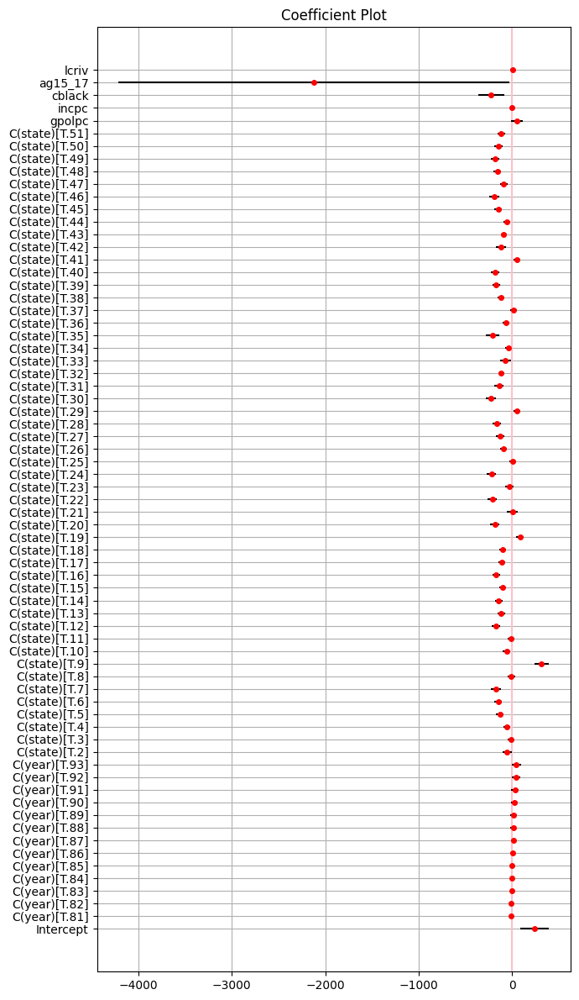

In [ ]:
# Coefficient data frame
fe_full_coef = pd.DataFrame({
    'coef': full.params,
    'error': full.conf_int()[1] - full.params # upper - estimate
})

# Visualizing all effects
plt.figure(figsize=(7, 12))
plt.axvline(x=0, color='pink')
plt.errorbar(x=fe_full_coef['coef'], y=fe_full_coef.index, xerr=fe_full_coef['error'], # 95% confidence interval
             linestyle='', fmt='o', mfc='red', mec='red', ms=4, ecolor='black')
plt.grid()
plt.title('Coefficient Plot')
plt.tight_layout()

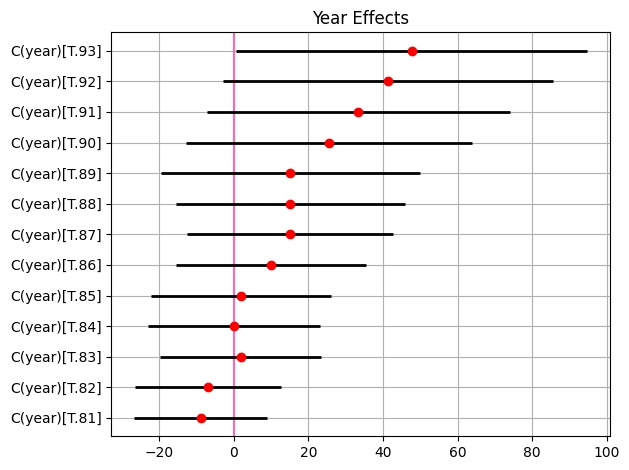

In [ ]:
# time
fe_full_year_index = [p for p in full.params.index if 'year' in p]
plt.axvline(x=0, color='hotpink')
plt.errorbar(x=fe_full_coef['coef'][fe_full_year_index], y=fe_full_year_index,
             xerr=fe_full_coef['error'][fe_full_year_index], # 95% confidence interval
             linestyle='', fmt='o', mfc='red', mec='red', ms=6, ecolor='black', lw=2)
plt.grid()
plt.title('Year Effects')
plt.tight_layout()

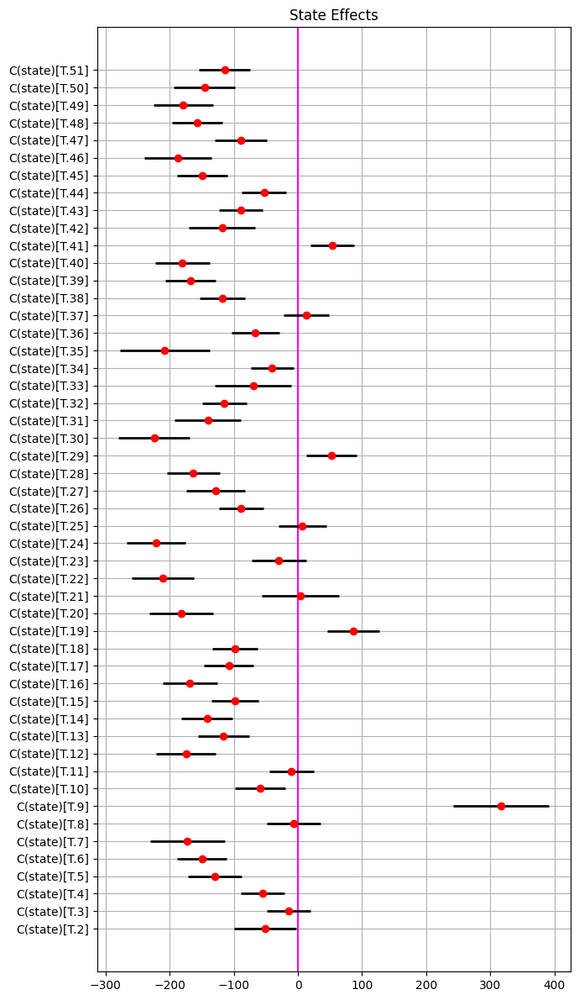

In [ ]:
# state
fe_full_year_index = [p for p in full.params.index if 'state' in p]
plt.figure(figsize=(7, 12))
plt.axvline(x=0, color='fuchsia')
plt.errorbar(x=fe_full_coef['coef'][fe_full_year_index], y=fe_full_year_index,
             xerr=fe_full_coef['error'][fe_full_year_index], # 95% confidence interval
             linestyle='', fmt='o', mfc='red', mec='red', ms=6, ecolor='black', lw=2)
plt.grid()
plt.title('State Effects')
plt.tight_layout()

#### Coefficient Maps:
- We can see from the Year effects plot that the confidence intervals overlap the axis quite significantly, indicating that there is some level of significance to the time effects.
- As a note, state effects was added for completeness and not for any further discussion, as we have already seen from testing that it is insignificant to the model.


In [ ]:
time.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   pris   R-squared:                       0.686
Model:                            OLS   Adj. R-squared:                  0.678
Method:                 Least Squares   F-statistic:                     84.27
Date:                Fri, 06 Dec 2024   Prob (F-statistic):          5.52e-161
Time:                        05:40:06   Log-Likelihood:                -4089.5
No. Observations:                 714   AIC:                             8217.
Df Residuals:                     695   BIC:                             8304.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        19.3450     76.667      0.252      0.801    -131.181     169.871
C(year)[T.81]     1.3184     15.177      0.087      0.931     -28.480      31.117
C(year)[T.82]    13.8311     15.802      0.875      0.382     -17.194      44.856
C(year)[T.83]    33.9275     16.610      2.043      0.041       1.316      66.539
C(year)[T.84]    38.2282     16.757      2.281      0.023       5.328      71.128
C(year)[T.85]    42.2433     16.677      2.533      0.012       9.499      74.987
C(year)[T.86]    48.0774     16.488      2.916      0.004      15.705      80.450
C(year)[T.87]    60.9408     16.893      3.607      0.000      27.773      94.109
C(year)[T.88]    65.4262     17.676      3.701      0.000      30.721     100.131
C(year)[T.89]    72.3052     18.846      3.837      0.000      35.303     109.307
C(year)[T.90]    81.1579     19.385      4.187      0.000      43.098     119.218
C(year)[T.91]    89.8870     19.706      4.561      0.000      51.196     128.578
C(year)[T.92]   101.8523     19.869      5.126      0.000      62.843     140.862
C(year)[T.93]   111.4389     20.170      5.525      0.000      71.837     151.041
gpolpc           70.1370     53.101      1.321      0.187     -34.120     174.394
incpc             0.0021      0.002      1.187      0.236      -0.001       0.005
cblack         -588.7901     33.958    -17.339      0.000    -655.463    -522.117
ag15_17        -920.2184   1171.736     -0.785      0.433   -3220.785    1380.348
lcriv           108.9091      4.809     22.646      0.000      99.467     118.351
==============================================================================
Omnibus:                      202.573   Durbin-Watson:                   0.335
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              920.608
Skew:                           1.223   Prob(JB):                    1.24e-200
Kurtosis:                       7.996   Cond. No.                     6.39e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.39e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Model Selection and Discussion:
- We can therefore conclude that our model with the fixed effects for time is our model of choice.
- We know this because it does a better job at explaining variation in pris than the pooled model does, and that the state fixed effects are statistically insignificant (as proven by the ANOVA test and the graphs)
- Furthermore, we know that the model has fixed effects and that compared to the random effects model, including fixed effects does a better job in explaining variation (as proven by the Hausman test)


#### Interpretation:
- From the summary output above, we can see that the coefficients on cblack and lcriv are statistically significant at the 1% levels, so we interpret those.
- "Cblack" indicates the change in the black population, expressed as a percentage. For every unit that "cblack" increases, "pris" falls by around 589 units, where "pris" indicates the number out of 100,000 people that are currently incarcerated at the time of survey. This indicates that the more the prison population shifts towards the black demographic, the smaller the overall population becomes.
- "Lcriv" is the log of "criv", which the number of violent crimes per 100,000. In this case, the coefficient tells us that for every 1% increase in violent crimes, the prison population per 100,000 increases by 1.089 units.
- Economically, these statistics are significant in that they tell us how the prison populations shift over time and over locations, and how we can better suit public policy and rehabilitation towards the demographics and the types of crimes being committed.

# Question 2

### 1.
Briefly discuss your data and economic/finance/business question you are trying to answer with your model.

We have chosen a dataset which includes criminals who have reoffended. Specifically, with the variables super (release supervised), workprg (in N.C pris. work prg.) , property (if property crime), person (if crime was against person), educ(years of schooling), tserved (time served), we wanted to answer whether a criminal recieved a felony sentence, and to what magnitude these factors affected the probability of a felony sentence.


In [ ]:
data_2 = woo.data('recid')

### 2.
Provide a descriptive analysis of your variables. This should include histograms and fitted distributions, correlation plot, boxplots, scatterplots, and statistical summaries (e.g., the five-number summary). All figures must include comments.


In [ ]:
#Summary Stats
data_2.describe()

,black,alcohol,drugs,super,married,felon,workprg,property,person,priors,educ,rules,age,tserved,follow,durat,cens,ldurat
count,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000
mean,0.485121,0.209689,0.241522,0.694118,0.255363,0.314187,0.465052,0.254671,0.053287,1.431834,9.702422,1.185467,345.435986,19.182007,74.885813,55.372318,0.617993,3.745150
std,0.499952,0.407227,0.428154,0.460940,0.436216,0.464352,0.498950,0.435827,0.224683,2.850443,2.441567,2.295409,121.050536,20.963778,3.500510,27.297830,0.486046,0.925045
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,198.000000,0.000000,70.000000,1.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,0.000000,258.000000,6.000000,72.000000,27.000000,0.000000,3.295837
50%,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,307.000000,12.000000,74.000000,71.000000,1.000000,4.262680
75%,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,2.000000,11.000000,1.000000,395.000000,25.000000,78.000000,76.000000,1.000000,4.330733
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,28.000000,19.000000,27.000000,933.000000,219.000000,81.000000,81.000000,1.000000,4.394449


Discussion of Boxplots:

I have provided boxplots for felon against all the quantitative variables present in the dataset (priors, educ, rules, age, tserved, follow, durat, cens, and ldurat)

([<matplotlib.axis.XTick at 0x79adb3a11de0>,
 [Text(1, 0, 'Felon'), Text(2, 0, 'Not a Felon')])

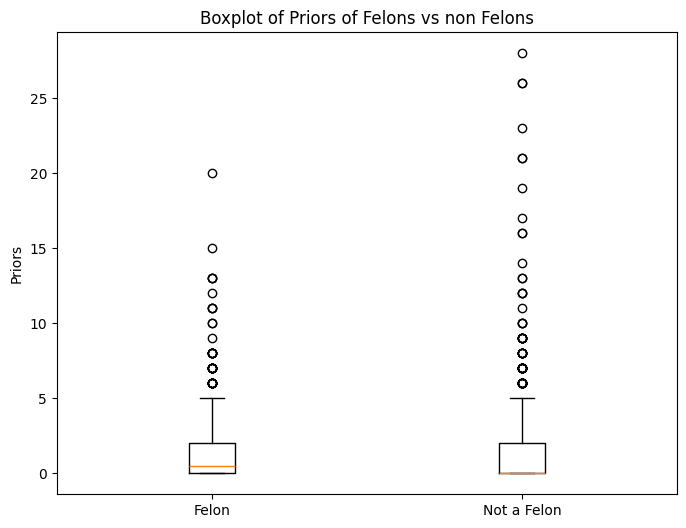

In [ ]:
#Boxplots for dummy variables:
data1 = [data_2[data_2.felon == 1].priors, data_2[data_2.felon == 0].priors]
plt.figure(figsize=(8,6))
plt.boxplot(data1)
plt.title('Boxplot of Priors of Felons vs non Felons')
plt.ylabel('Priors')
plt.xticks([1,2], ['Felon', 'Not a Felon'])

([<matplotlib.axis.XTick at 0x79adb3e0ff40>,
 [Text(1, 0, 'Felon'), Text(2, 0, 'Not a Felon')])

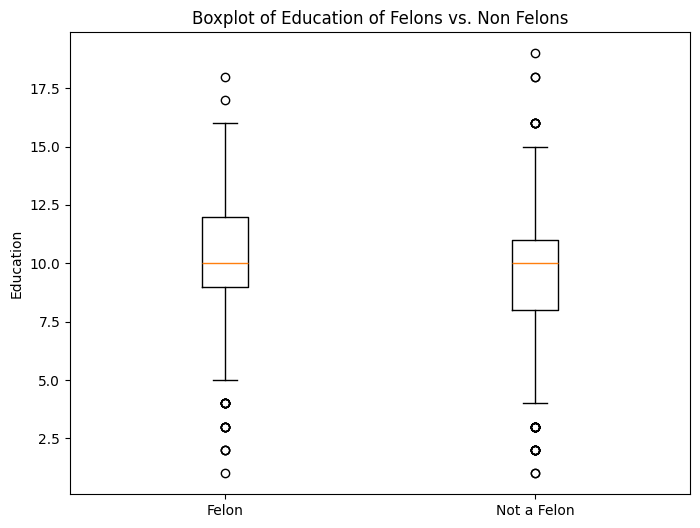

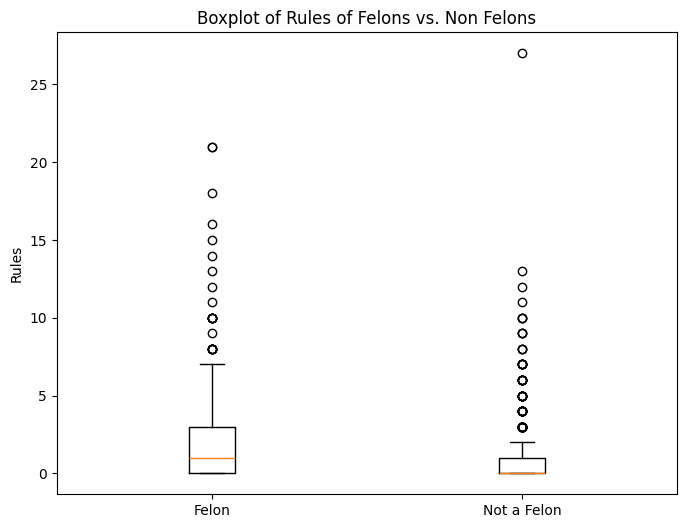

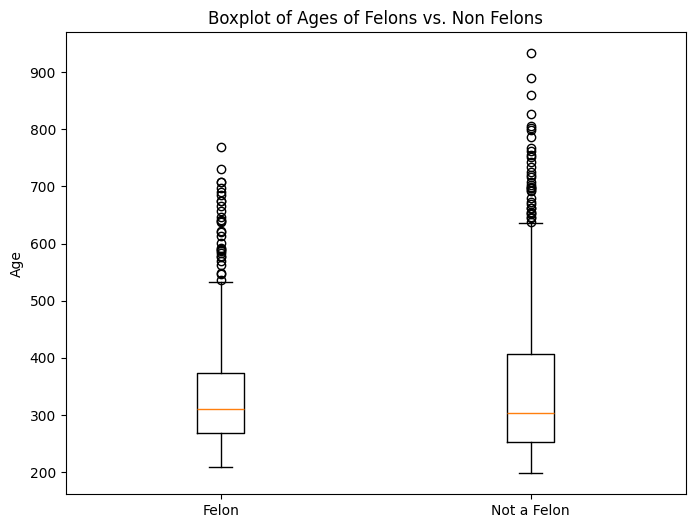

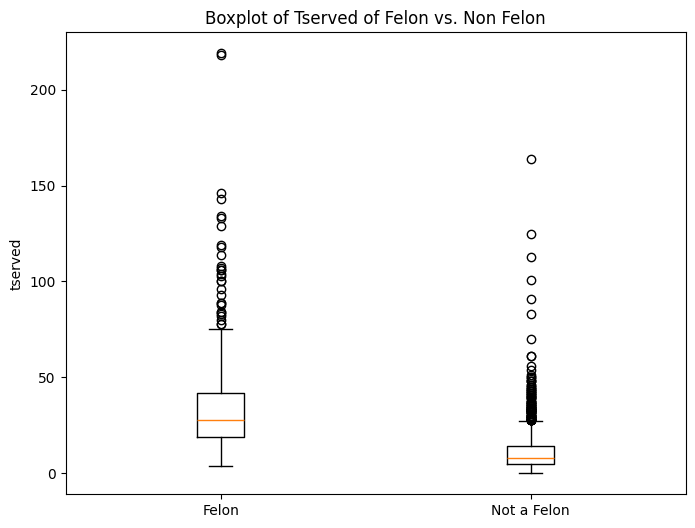

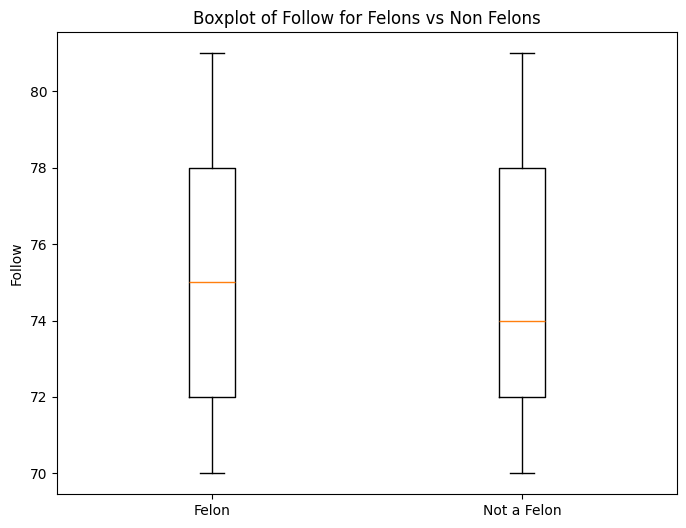

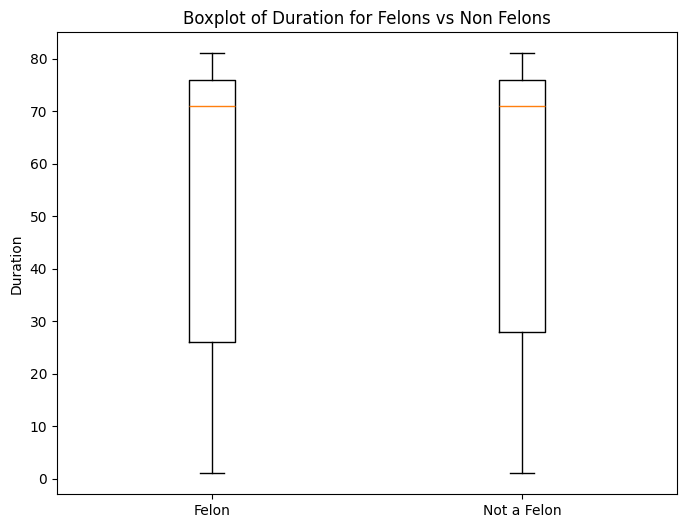

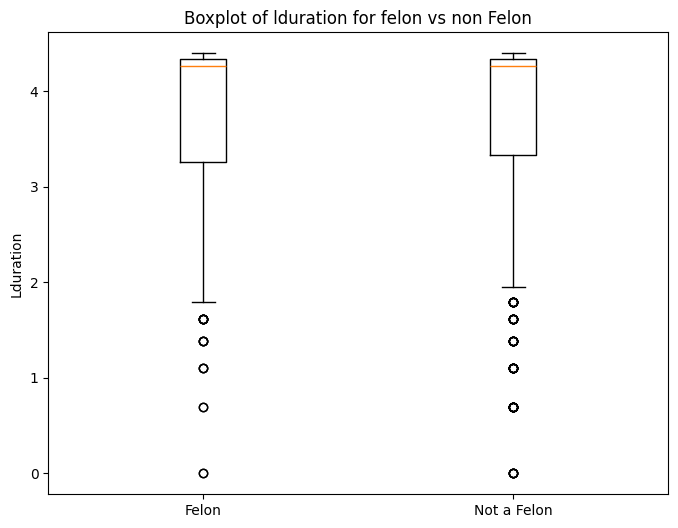

In [ ]:
data2 = [data_2[data_2.felon == 1].educ, data_2[data_2.felon == 0].educ]
plt.figure(figsize=(8,6))
plt.boxplot(data2)
plt.title('Boxplot of Education of Felons vs. Non Felons')
plt.ylabel('Education')
plt.xticks([1,2], ['Felon', 'Not a Felon'])

data3 = [data_2[data_2.felon == 1].rules, data_2[data_2.felon == 0].rules]
plt.figure(figsize=(8,6))
plt.boxplot(data3)
plt.title('Boxplot of Rules of Felons vs. Non Felons')
plt.ylabel('Rules')
plt.xticks([1,2], ['Felon', 'Not a Felon'])

data4 = [data_2[data_2.felon == 1].age, data_2[data_2.felon == 0].age]
plt.figure(figsize=(8,6))
plt.boxplot(data4)
plt.title('Boxplot of Ages of Felons vs. Non Felons')
plt.ylabel('Age')
plt.xticks([1,2], ['Felon', 'Not a Felon'])

data5 = [data_2[data_2.felon == 1].tserved, data_2[data_2.felon == 0].tserved]
plt.figure(figsize=(8,6))
plt.boxplot(data5)
plt.title('Boxplot of Tserved of Felon vs. Non Felon')
plt.ylabel('tserved')
plt.xticks([1,2], ['Felon', 'Not a Felon'])

data6 = [data_2[data_2.felon == 1].follow, data_2[data_2.felon == 0].follow]
plt.figure(figsize=(8,6))
plt.boxplot(data6)
plt.title('Boxplot of Follow for Felons vs Non Felons')
plt.ylabel('Follow')
plt.xticks([1,2], ['Felon', 'Not a Felon'])

data7 = [data_2[data_2.felon == 1].durat, data_2[data_2.felon == 0].durat]
plt.figure(figsize=(8,6))
plt.boxplot(data7)
plt.title('Boxplot of Duration for Felons vs Non Felons')
plt.ylabel('Duration')
plt.xticks([1,2], ['Felon', 'Not a Felon'])

data8 = [data_2[data_2.felon == 1].ldurat, data_2[data_2.felon == 0].ldurat]
plt.figure(figsize=(8,6))
plt.boxplot(data8)
plt.title('Boxplot of lduration for felon vs non Felon')
plt.ylabel('Lduration')
plt.xticks([1,2], ['Felon', 'Not a Felon'])

Discussion:

Below are scatterplots of quantitative variabes in the dataset. This helps us view possible multicolliniearity between variables:


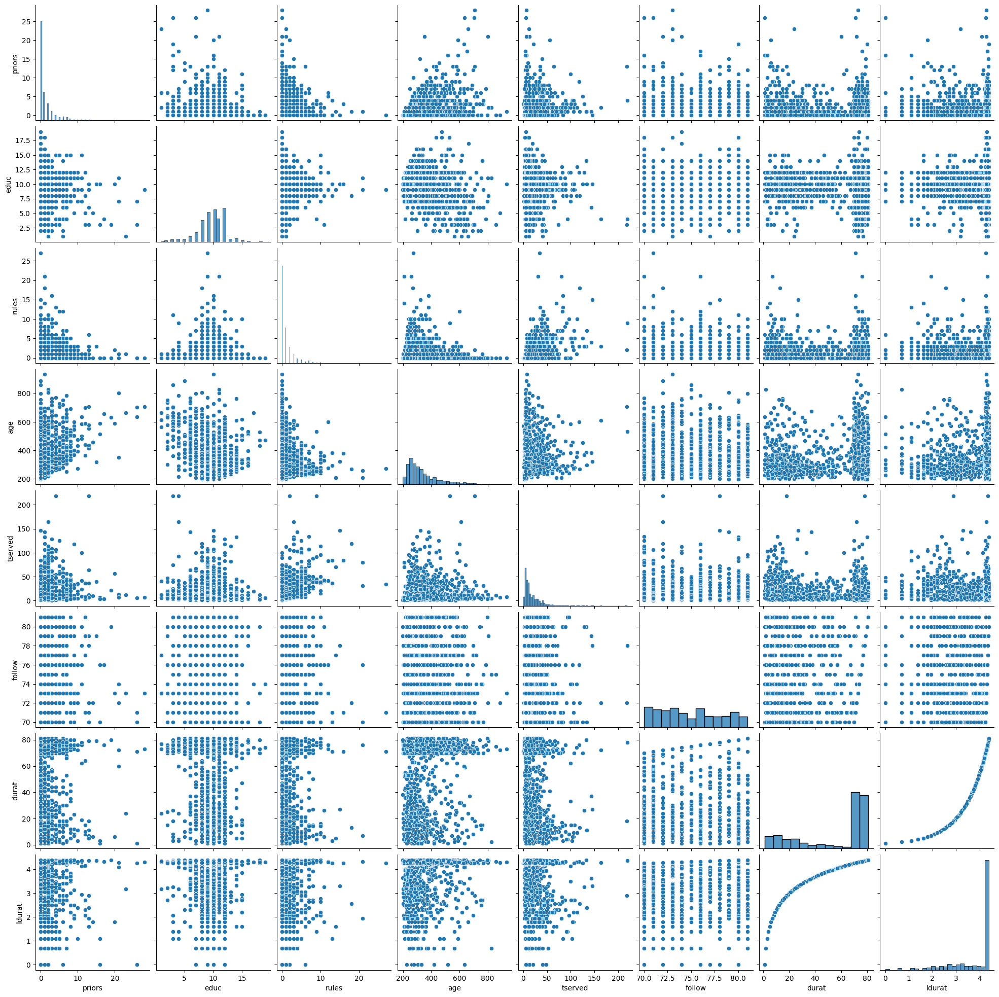

In [ ]:
# scatterplots
sns.pairplot(data_2, vars=["priors", "educ", "rules", "age", "tserved", "follow", "durat", "ldurat"])
plt.show()

Discussion:

Here are the histograms for all the quant. variables. Most are non normally distributed with the exception of education.

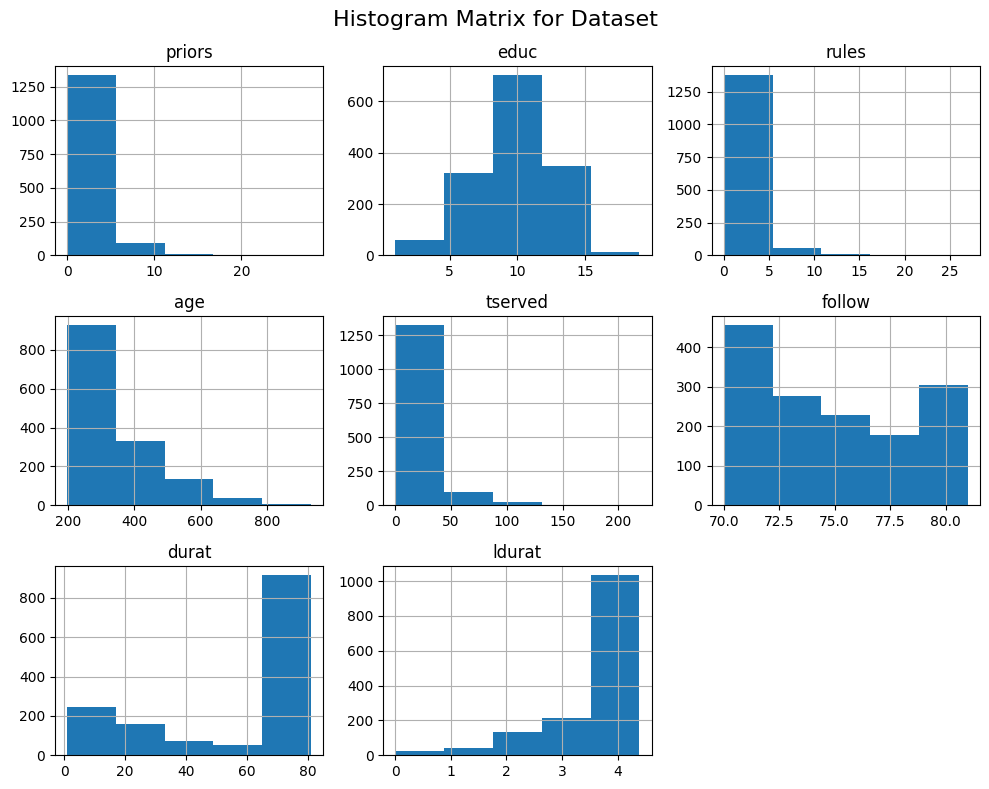

In [ ]:
#Histograms for quant variables
data_2_quant = data_2[['priors', 'educ', 'rules', 'age', 'tserved', 'follow', 'durat', 'ldurat']]
data_2_quant.hist(figsize=(10, 8), bins=5)
# Add a title
plt.suptitle("Histogram Matrix for Dataset", fontsize=16)
plt.tight_layout()
# Show the plot
plt.show()

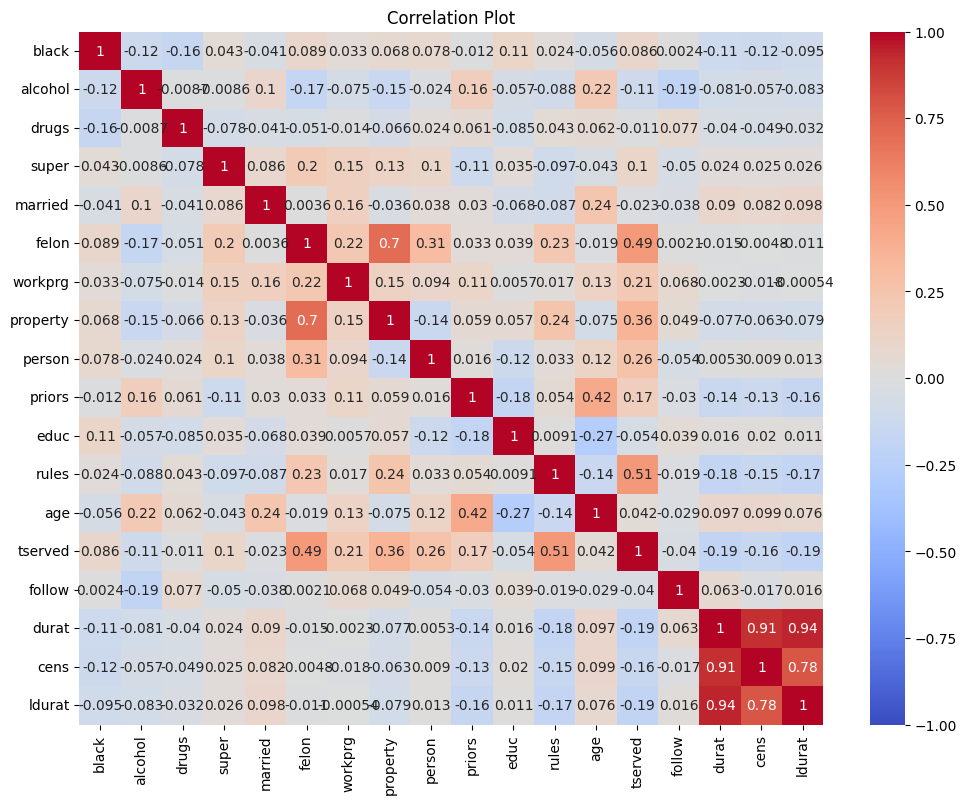

In [ ]:
#Correlation matrix:
# Calculate the correlation matrix
corr_matrix = data_2.corr()
# Plot the heatmap
plt.figure(figsize=(12, 9))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Plot')
plt.show()

### 3.
Fit the three models below, and identify which model is your preferred one and why. As part of your model assessment, you will need to compute the Confusion matrix for the training and testing samples (you can do a 2/3 training, 1/3 testing split), and base your decision on the testing errors. Make sure to include relevant plots, statistical diagnostics, etc., to support your conclusion, and to comment on your findings.
* Linear Probability Model
* Probit
* Logit




Discussion on the LPM Model:

First, we included all variables in the LPM model, however many were insignificant. This resulted in the creation of model_2_final (the final LPM model)

In [ ]:
#OLS models:
model_2 = smf.ols('felon ~ black + alcohol + drugs + super + married + workprg + property + person + priors + educ + rules + age + tserved + follow + durat + cens + ldurat', data_2).fit()
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  felon   R-squared:                       0.695
Model:                            OLS   Adj. R-squared:                  0.691
Method:                 Least Squares   F-statistic:                     190.9
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        21:56:17   Log-Likelihood:                -84.559
No. Observations:                1445   AIC:                             205.1
Df Residuals:                    1427   BIC:                             300.1
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0187      0.178     -0.105      0.916      -0.368       0.331
black         -0.0049      0.014     -0.347      0.728      -0.033       0.023
alcohol       -0.0347      0.018     -1.923      0.055      -0.070       0.001
drugs          0.0004      0.016      0.027      0.978      -0.032       0.033
super          0.0408      0.016      2.615      0.009       0.010       0.071
married        0.0077      0.016      0.468      0.640      -0.025       0.040
workprg        0.0464      0.015      3.194      0.001       0.018       0.075
property       0.7310      0.018     41.257      0.000       0.696       0.766
person         0.7410      0.033     22.281      0.000       0.676       0.806
priors        -0.0024      0.003     -0.860      0.390      -0.008       0.003
educ           0.0084      0.003      2.852      0.004       0.003       0.014
rules         -0.0047      0.004     -1.308      0.191      -0.012       0.002
age        -3.428e-05   6.85e-05     -0.500      0.617      -0.000       0.000
tserved        0.0037      0.000      8.377      0.000       0.003       0.005
follow        -0.0022      0.002     -1.036      0.300      -0.006       0.002
durat       2.999e-05      0.001      0.023      0.982      -0.003       0.003
cens           0.0143      0.040      0.358      0.720      -0.064       0.093
ldurat         0.0231      0.026      0.896      0.370      -0.027       0.074
==============================================================================
Omnibus:                      245.543   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2351.897
Skew:                           0.484   Prob(JB):                         0.00
Kurtosis:                       9.175   Cond. No.                     9.95e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.95e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
#remove statistically insignificant variables - this is the final model we will work with:
model_2_final = smf.ols('felon ~ super + workprg + property + person + educ + tserved', data_2).fit()
model_2_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  felon   R-squared:                       0.688
Model:                            OLS   Adj. R-squared:                  0.687
Method:                 Least Squares   F-statistic:                     529.6
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        21:56:23   Log-Likelihood:                -98.850
No. Observations:                1445   AIC:                             211.7
Df Residuals:                    1438   BIC:                             248.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.1184      0.031     -3.869      0.000      -0.178      -0.058
super          0.0496      0.015      3.260      0.001       0.020       0.079
workprg        0.0484      0.014      3.409      0.001       0.021       0.076
property       0.7319      0.018     41.612      0.000       0.697       0.766
person         0.7544      0.033     22.831      0.000       0.690       0.819
educ           0.0093      0.003      3.275      0.001       0.004       0.015
tserved        0.0031      0.000      8.226      0.000       0.002       0.004
==============================================================================
Omnibus:                      249.328   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2567.566
Skew:                           0.471   Prob(JB):                         0.00
Kurtosis:                       9.462   Cond. No.                         144.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Discussion on Confusion Matrix:

After splitting the data into testing and training data, we obtained  confusion matricies which provide us a measure of the accuracy of our model, sensitivity, and many other metrics.

Specifically for this model the accuracy is: 0.932927, and the sensitivity is 0.897260

In [ ]:
#train/test data:
data2_train, data2_test = train_test_split(data_2, train_size=0.66)
data2_train_y = data2_train['felon']
data2_train_X = data2_train.drop('felon', axis=1)



In [ ]:
#LPM real
lpm_train = smf.ols('felon ~ super + workprg + property + person + educ + tserved', data=data_2).fit()

In [ ]:
#performance evaluation function from slides
# Note:
#   Below we construct a function that computes most of the classification metrics
#   from scikit-learn. Missing are "specificity" and "NPV", which are easy enough
#   to construct yourself, if they are desired.

def performance_evaluation(y_true, y_pred, y_pred_prob, y_train, string=True):
    """Evaluate binary classification performance

    Args:
        y_true (1d array-like): true labels from test set
        y_pred (1d array-like): predicted labels
        y_pred_prob (1d array-like): predicted probabilities, for AUC computations
        y_train (1d array-like): true labels from train set, for no information rate
        string (bool, optional): output results as a string, otherwise output is a tuple; defaults to True
    """
    output1 = pd.DataFrame(
        confusion_matrix(y_true=y_true, y_pred=y_pred).T,
        columns=['True (0)', 'True (1)'], index=['Predict (0)', 'Predict (1)']
    )

    metric = [
        'Accuracy', 'No Information Rate', 'Kappa', 'Sensitivity', 'Pos Pred Value',
        'Avg Precision', 'Balanced Accuracy', 'AUC ROC', 'F1'
    ]
    results = [
        accuracy_score(y_true, y_pred),                 # accuracy
        np.mean(y_true == np.median(y_train)),          # no information rate
        cohen_kappa_score(y_true, y_pred),              # kappa
        recall_score(y_true, y_pred),                   # sensitivity
        precision_score(y_true, y_pred),                # positive predictive value
        average_precision_score(y_true, y_pred_prob),   # AUC precision-recall curve
        balanced_accuracy_score(y_true, y_pred),        # balanced accuracy score
        roc_auc_score(y_true, y_pred_prob),             # AUC ROC curve
        f1_score(y_true, y_pred)                        # F1 score
    ]

    output2 = pd.DataFrame({'Metric':metric, 'Score':results})

    if string: return f'Confusion matrix: \n{output1} \n\nPerformance metrics: \n{output2}'
    return (output1, output2)


In [ ]:
# Confusion matrix
lpm_train = smf.ols('felon ~ super + workprg + property + person + educ + tserved', data=data2_train).fit()
test_pred_prob = lpm_train.predict(data2_test)
test_pred_labels = (test_pred_prob >= 0.5).astype(int)

# Evaluate performance on the test set
lpm_test_performance = performance_evaluation(
    y_true=data2_test['felon'],
    y_pred=test_pred_labels,
    y_pred_prob=test_pred_prob,
    y_train=data2_train['felon']
)

# Print performance evaluation results
print(lpm_test_performance)

Confusion matrix: 
             True (0)  True (1)
Predict (0)       328        15
Predict (1)        18       131 

Performance metrics: 
                Metric     Score
0             Accuracy  0.932927
1  No Information Rate  0.703252
2                Kappa  0.840247
3          Sensitivity  0.897260
4       Pos Pred Value  0.879195
5        Avg Precision  0.894479
6    Balanced Accuracy  0.922619
7              AUC ROC  0.962487
8                   F1  0.888136


In [ ]:
#probit model
probit_2 = smf.probit('felon ~ super + workprg + property + person + educ + tserved', data=data_2).fit()
print(probit_2.summary())



Optimization terminated successfully.
         Current function value: 0.234915
         Iterations 7
                          Probit Regression Results                           
Dep. Variable:                  felon   No. Observations:                 1445
Model:                         Probit   Df Residuals:                     1438
Method:                           MLE   Df Model:                            6
Date:                Fri, 06 Dec 2024   Pseudo R-squ.:                  0.6226
Time:                        21:58:08   Log-Likelihood:                -339.45
converged:                       True   LL-Null:                       -899.38
Covariance Type:            nonrobust   LLR p-value:                1.053e-238
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -3.2157      0.282    -11.392      0.000      -3.769      -2.662
super          0.4825      0.

Discussion on Confusion Matrix:

The accuracy for this model is: .926829, while sensitivity is 0.904110

In [ ]:

# Confusion matrix
probit_train = smf.probit('felon ~ super + workprg + property + person + educ + tserved', data=data2_train).fit()
probit_test = smf.probit('felon ~ super + workprg + property + person + educ + tserved', data=data2_test).fit()

test_pred_prob = probit_train.predict(data2_test)


test_pred_labels = (test_pred_prob >= 0.5).astype(int)

# Evaluate performance on the test set
probit_test_performance = performance_evaluation(
    y_true=data2_test['felon'],
    y_pred=test_pred_labels,
    y_pred_prob=test_pred_prob,
    y_train=data2_train['felon']
)


print(probit_test_performance)

Optimization terminated successfully.
         Current function value: 0.233850
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.207231
         Iterations 7
Confusion matrix: 
             True (0)  True (1)
Predict (0)       324        14
Predict (1)        22       132 

Performance metrics: 
                Metric     Score
0             Accuracy  0.926829
1  No Information Rate  0.703252
2                Kappa  0.827422
3          Sensitivity  0.904110
4       Pos Pred Value  0.857143
5        Avg Precision  0.856588
6    Balanced Accuracy  0.920263
7              AUC ROC  0.956430
8                   F1  0.880000


In [ ]:
#logit model:
logit_mod = smf.logit('felon ~ super + workprg + property + person + educ + tserved', data=data_2).fit()
print(logit_mod.summary())



Optimization terminated successfully.
         Current function value: 0.235222
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                  felon   No. Observations:                 1445
Model:                          Logit   Df Residuals:                     1438
Method:                           MLE   Df Model:                            6
Date:                Fri, 06 Dec 2024   Pseudo R-squ.:                  0.6221
Time:                        21:58:46   Log-Likelihood:                -339.90
converged:                       True   LL-Null:                       -899.38
Covariance Type:            nonrobust   LLR p-value:                1.639e-238
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -6.0382      0.567    -10.652      0.000      -7.149      -4.927
super          0.9529      0.

Confusion Matrix:

The accuracy for this model is .930894, while the sensitivity is 0.910959

In [ ]:

# Confusion matrix
logit_train = smf.logit('felon ~ super + workprg + property + person + educ + tserved', data=data2_train).fit()
logit_test = smf.logit('felon ~ super + workprg + property + person + educ + tserved', data=data2_test).fit()

test_pred_prob = logit_train.predict(data2_test)


test_pred_labels = (test_pred_prob >= 0.5).astype(int)

# Evaluate performance on the test set
logit_test_performance = performance_evaluation(
    y_true=data2_test['felon'],
    y_pred=test_pred_labels,
    y_pred_prob=test_pred_prob,
    y_train=data2_train['felon']
)


print(logit_test_performance)

Optimization terminated successfully.
         Current function value: 0.235341
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.207494
         Iterations 8
Confusion matrix: 
             True (0)  True (1)
Predict (0)       325        13
Predict (1)        21       133 

Performance metrics: 
                Metric     Score
0             Accuracy  0.930894
1  No Information Rate  0.703252
2                Kappa  0.837010
3          Sensitivity  0.910959
4       Pos Pred Value  0.863636
5        Avg Precision  0.852916
6    Balanced Accuracy  0.925133
7              AUC ROC  0.955618
8                   F1  0.886667


Discussion on Chosen Model:

The LPM model is the best model. It has the highest values of accuracy and sensitivity. Specifically, the model correctly classifies felons 93.90% of the time. Additionally cases where felon = 1  are correctly classfied by the model 89.72 % of the time.

These metrics are higher than the other two models. The Average precision and balanced accuracy scores are consistent with this as well.

### 4.
 For each model, find the “critical value” at which the fitted probabilities are ≳ 0.5.

In [ ]:
#LPM
lpm_coeffs = model_2_final.params
lpm_critical_value = (0.5 - lpm_coeffs['Intercept']) / lpm_coeffs['person']
print(lpm_critical_value)

0.8196595786809775


In [ ]:
#Probit
probit_coeffs = probit_2.params
probit_critical_value = -probit_coeffs['Intercept'] / probit_coeffs['person']
print(probit_critical_value)

1.2177678947151367


In [ ]:
#Logit

logit_coeffs = logit_mod.params
logit_critical_value = -logit_coeffs['Intercept'] / logit_coeffs['person']
print(logit_critical_value)

1.2545741730237303


### 5.
Based on the misclassification rates from Step 3, vary the 0.5 threshold and find a more appropriate threshold that minimizes one of the two errors, and comment on it.


In [ ]:
# Confusion matrix with 0.5 Threshold
lpm_train = smf.ols('felon ~ super + workprg + property + person + educ + tserved', data=data2_train).fit()


test_pred_prob = lpm_train.predict(data2_test)


test_pred_labels = (test_pred_prob >= 0.5).astype(int)
# Evaluate performance on the test set
lpm_test_performance = performance_evaluation(
    y_true=data2_test['felon'],
    y_pred=test_pred_labels,
    y_pred_prob=test_pred_prob,
    y_train=data2_train['felon']
)


print(lpm_test_performance)

Confusion matrix: 
             True (0)  True (1)
Predict (0)       328        15
Predict (1)        18       131 

Performance metrics: 
                Metric     Score
0             Accuracy  0.932927
1  No Information Rate  0.703252
2                Kappa  0.840247
3          Sensitivity  0.897260
4       Pos Pred Value  0.879195
5        Avg Precision  0.894479
6    Balanced Accuracy  0.922619
7              AUC ROC  0.962487
8                   F1  0.888136


In [ ]:
#Determine thresholds to equilize the effect of false positives and false negatives, minimize false positives, and minimize false negatives

from sklearn.metrics import precision_recall_curve, f1_score

y_true = data2_test['felon']
y_pred_prob = test_pred_prob
y_pred=test_pred_labels

sensitivity = recall_score(y_true, y_pred),                   # sensitivity
precision = precision_score(y_true, y_pred),                # precision
f1 = f1_score(y_true, y_pred)

# PR curve values
precision, recall, thresholds_pr = precision_recall_curve(y_true, y_pred_prob)

# Maximize F1 score
f1_scores = [2 * (p * r) / (p + r) if p + r > 0 else 0 for p, r in zip(precision, recall)]
optimal_idx_pr = np.argmax(f1_scores)
optimal_threshold_pr = thresholds_pr[optimal_idx_pr]
print(f"Threshold to Maximize F1: {optimal_threshold_pr}")

# Maximize precision score (minimize FP)
max_precision = np.argmax(precision)  # Exclude last precision (undefined threshold)
max_precision_threshold = thresholds_pr[max_precision]
print(f"Threshold to Maximize Precision: {max_precision_threshold}")

Threshold to Maximize F1: 0.7245136580722544
Threshold to Maximize Precision: 1.2062418963893276


In [ ]:
# Confusion matrix with Threshold to Maximize Precision
lpm_train = smf.ols('felon ~ super + workprg + property + person + educ + tserved', data=data2_train).fit()


test_pred_prob = lpm_train.predict(data2_test)

# (threshold at 1.2062418963893276 to minimize false positives)
test_pred_labels = (test_pred_prob >= 1.2062418963893276).astype(int)

# Evaluate performance on the test set
lpmnew_test_performance = performance_evaluation(
    y_true=data2_test['felon'],
    y_pred=test_pred_labels,
    y_pred_prob=test_pred_prob,
    y_train=data2_train['felon']
)


print(lpmnew_test_performance)

Confusion matrix: 
             True (0)  True (1)
Predict (0)       346       142
Predict (1)         0         4 

Performance metrics: 
                Metric     Score
0             Accuracy  0.711382
1  No Information Rate  0.703252
2                Kappa  0.038110
3          Sensitivity  0.027397
4       Pos Pred Value  1.000000
5        Avg Precision  0.894479
6    Balanced Accuracy  0.513699
7              AUC ROC  0.962487
8                   F1  0.053333


In [ ]:
# Confusion matrix with Threshold to Maximize F1
lpm_train = smf.ols('felon ~ super + workprg + property + person + educ + tserved', data=data2_train).fit()


test_pred_prob = lpm_train.predict(data2_test)

# (threshold at 0.7245136580722544 to max F1 score)
test_pred_labels = (test_pred_prob >= 0.7245136580722544).astype(int)
# Evaluate performance on the test set
lpm2new_test_performance = performance_evaluation(
    y_true=data2_test['felon'],
    y_pred=test_pred_labels,
    y_pred_prob=test_pred_prob,
    y_train=data2_train['felon']
)

# Print performance evaluation results
print(lpm2new_test_performance)

Confusion matrix: 
             True (0)  True (1)
Predict (0)       331        15
Predict (1)        15       131 

Performance metrics: 
                Metric     Score
0             Accuracy  0.939024
1  No Information Rate  0.703252
2                Kappa  0.853908
3          Sensitivity  0.897260
4       Pos Pred Value  0.897260
5        Avg Precision  0.894479
6    Balanced Accuracy  0.926954
7              AUC ROC  0.962487
8                   F1  0.897260


Given our AUC ROC score from question #3, the rate of classifying observations is good.  A AUC ROC score of 1 is perfect, and anything above 0.9 is a good rate.  This means that we could theoretically leave the threshold at 0.5.  Additionally, our accuracy is above 0.9, which is another good sign.


However, if we wish to minimize false positives or false negatives, we can do so as well.  While it does not matter as much which error we minimize given the kind of our data, we would wish to minimize false positives since we do not want to have our model predict people to be felons when they are not.  To minimize false positives, that means we want the precision to be high.  Our precision is already 0.879195, but we can increase this to 1 (which would give us a no false positives), if we increase our threshold for predicting to approximately 1.2.  Theoretically, the threshold should lie between 0 and 1, but our model has predictions that go as high as 1.6, which leads the threshold to be above 1.  However, doing so, we compromise the sensitivity value, and end up with a lot of false negatives.  It also lowers our accuracy rate overall.



Another option is to equilize the sensitivity and precision, so there is an even amount of false positives and false negatives.  This is done by finding the threshold that maximizes the F1 value.  When this is done, the accuracy slightly increases, and the precision also slightly increases, with the sensitivity staying the same (compared to using the traditional 0.5 threshold).  This seems to be the best threshold option, especially considering whether we minimize false positives or false negatives is not a vital question given our data set (compared to other models that that could predict whether someone has cancer or is pregnant, where it is important to minimize false negatives).

### 6.
Using your preferred model from Step 3, make 4 different predictions, and comment on their reliability.

In [ ]:
model_2_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  felon   R-squared:                       0.688
Model:                            OLS   Adj. R-squared:                  0.687
Method:                 Least Squares   F-statistic:                     529.6
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        22:01:23   Log-Likelihood:                -98.850
No. Observations:                1445   AIC:                             211.7
Df Residuals:                    1438   BIC:                             248.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.1184      0.031     -3.869      0.000      -0.178      -0.058
super          0.0496      0.015      3.260      0.001       0.020       0.079
workprg        0.0484      0.014      3.409      0.001       0.021       0.076
property       0.7319      0.018     41.612      0.000       0.697       0.766
person         0.7544      0.033     22.831      0.000       0.690       0.819
educ           0.0093      0.003      3.275      0.001       0.004       0.015
tserved        0.0031      0.000      8.226      0.000       0.002       0.004
==============================================================================
Omnibus:                      249.328   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2567.566
Skew:                           0.471   Prob(JB):                         0.00
Kurtosis:                       9.462   Cond. No.                         144.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
data_2.describe()

,black,alcohol,drugs,super,married,felon,workprg,property,person,priors,educ,rules,age,tserved,follow,durat,cens,ldurat
count,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000,1445.000000
mean,0.485121,0.209689,0.241522,0.694118,0.255363,0.314187,0.465052,0.254671,0.053287,1.431834,9.702422,1.185467,345.435986,19.182007,74.885813,55.372318,0.617993,3.745150
std,0.499952,0.407227,0.428154,0.460940,0.436216,0.464352,0.498950,0.435827,0.224683,2.850443,2.441567,2.295409,121.050536,20.963778,3.500510,27.297830,0.486046,0.925045
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,198.000000,0.000000,70.000000,1.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,0.000000,258.000000,6.000000,72.000000,27.000000,0.000000,3.295837
50%,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,307.000000,12.000000,74.000000,71.000000,1.000000,4.262680
75%,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,2.000000,11.000000,1.000000,395.000000,25.000000,78.000000,76.000000,1.000000,4.330733
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,28.000000,19.000000,27.000000,933.000000,219.000000,81.000000,81.000000,1.000000,4.394449


In [ ]:
# prediction 1 (bad record for crime against person): prediction given super=1, workprg=0, property=0, person=1, educ=1, tserved=219

# Category probabilities
prediction_1 = (model_2_final.predict(pd.DataFrame({'super':1, 'workprg':1, 'property':0, 'person':1, 'educ':19, 'tserved':219}, index=['probs'])))
print(prediction_1)
# Cumulative probabilities
cumulative_1 = prediction_1.cumsum
print(cumulative_1)

probs    1.585887
dtype: float64
<bound method Series.cumsum of probs    1.585887
dtype: float64>


In [ ]:
# prediction 2 (bad record for crime against property): prediction given super=1, workprg=0, property=1, person=0, educ=1, tserved=219

# Category probabilities
prediction_2 = (model_2_final.predict(pd.DataFrame({'super':1, 'workprg':1, 'property':1, 'person':0, 'educ':19, 'tserved':219}, index=['probs'])))
print(prediction_2)
# Cumulative probabilities
cumulative_2 = prediction_2.cumsum
print(cumulative_2)

probs    1.563367
dtype: float64
<bound method Series.cumsum of probs    1.563367
dtype: float64>


In [ ]:
# prediction 3 (good record for crime against person): prediction given super=0, workprg=1, property=0, person=1, educ=19, tserved=0

# Category probabilities
prediction_3 = (model_2_final.predict(pd.DataFrame({'super':0, 'workprg':0, 'property':0, 'person':1, 'educ':1, 'tserved':0}, index=['probs'])))
print(prediction_3)
# Cumulative probabilities
cumulative_3 = prediction_3.cumsum
print(cumulative_3)

probs    0.645313
dtype: float64
<bound method Series.cumsum of probs    0.645313
dtype: float64>


In [ ]:
# prediction 4 (good record for crime against property): prediction given super=0, workprg=1, property=1, person=0, educ=19, tserved=0

# Category probabilities
prediction_4 = (model_2_final.predict(pd.DataFrame({'super':0, 'workprg':0, 'property':1, 'person':0, 'educ':1, 'tserved':0}, index=['probs'])))
print(prediction_4)
# Cumulative probabilities
cumulative_4 = prediction_4.cumsum
print(cumulative_4)

probs    0.622792
dtype: float64
<bound method Series.cumsum of probs    0.622792
dtype: float64>


Of the 4 predictions made, 2 of them were created to represent someone who has a better record, and 2 of them represent someone who has a worse record.  Of these, they are also split into whether the crime committed was against property or a person.  When deciding the values, I made the assumption that a person has a 'good' record if: they did not have to have supervised release, they were not a part of the prisoner's work program, they had a low level of education, and a low time served.  These assumptions are in allignment with the model that we have chosen, but do not make the most sense, logically.  For example, the coefficent on education is positive, meaning that if someone has a high education, they are more likely to be convicted of a felon.  However, we still use the assumptions that align with the model, since we are attempting to assess how accurately our model may be able to make predictions.

For the first two predictions, which uses aspects in which the model predicts there to be a higher chance of being a felon, it is predicted that the observation is a felon.  Similarly, for the second two predictions, which uses aspects in which the model predicts there to be a lower chance of being a felon, it is predicted the the observation is not a felon, using the threshold of 0.75 (the threshold determined to maximize the accuracy of the model predictions).

### 7.
Using your preferred model from Step 3, estimate the Average Marginal Effects and comment on them.

In [ ]:
ame = model_2_final.params*stats.norm.pdf(model_2_final.fittedvalues).mean()
print(ame)

Intercept   -0.042410
super        0.017757
workprg      0.017335
property     0.262238
person       0.270307
educ         0.003318
tserved      0.001106
dtype: float64


The average marginal effects are largest for property and person.  All of the effects are positive, which does not necessarily make the most sense logically.  For example, education is positive, meaning that the average marginal effect of an additional year of education is expected to result in an increase in the likelihood of being a felon by 0.003318.  However, this marginal effect is less than 1%, so it is not very significant, economically.